In [ ]:
!nvidia-smi

Sun Apr 11 06:59:07 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.67       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install tensorflow-gpu
!pip install tensorflow_addons==0.10.0


     |████████████████████████████████| 394.3MB 40kB/s 
     |████████████████████████████████| 1.1MB 7.1MB/s 


In [ ]:
import tensorflow
from tensorflow.keras.layers import *
from keras import backend as F
from tensorflow.keras.utils import Sequence 
from tensorflow.keras.models import Model as Module
from tensorflow.keras.optimizers import Adam
import keras
import zipfile
from tqdm.notebook import tqdm
import numpy as np
import os



In [ ]:
tensorflow.__version__

'2.4.1'

In [ ]:
filename="gridnpyall"

In [ ]:
def extract(filename):
    url='/content/drive//MyDrive/'+filename+'.zip'
    with zipfile.ZipFile(url) as zf:
          for member in tqdm(zf.infolist(), desc='Extracting '):
            try:
                zf.extract(member, './')
            except :
                print("problem")


In [ ]:
extract(filename)


In [ ]:
def duplicate_frames(video):
  stretched=[]
  for img in video:
    stretched.append(img)
    stretched.append(img)
  return np.array((stretched))  

In [ ]:
ord('z') - ord('a')

25

In [ ]:


class Lipread_Generator(Sequence):
    def __init__(self,video_path,align_path,batch_size=6,image_size=(118,150,300),label_max_len=50,shuffle=False,Augment=True,maxsamples=None):
        self.Xcol=[video_path+i  for i in os.listdir(video_path)]
        self.Ycol=[align_path+i.split('/')[-1].split('.')[0]+'.txt' for i in self.Xcol]
       
        self.index=list(range(0,len(self.Ycol)))
        self.shuffle=shuffle
        self.batch_size=batch_size
        self.ims=image_size
        self.label_len=label_max_len
        self.maxsamples=maxsamples
        #self.check()
    def check(self):
      for a,b in zip(sorted(self.Xcol),sorted(self.Ycol)):
        print(a.split('/')[-1].split('.')[0],b.split('/')[-1].split('.')[0])    
    def __len__(self):
        if(self.maxsamples):
             return self.maxsamples 
        return len(self.Xcol)//self.batch_size
    def  on_epoch_end(self):               
        if(self.shuffle):
          
          np.random.shuffle(self.index)# the records are shuffled         
          print("records  shuffled")   
    def read_data(self,no):
        
        X=self.Xcol[no]
        Y=self.Ycol[no]
        
        video=np.load(X)# lip video frames are stored as npy previously
        label=open(Y).read()
        
        if(len(video)<len(label)*2):
             
             raise Exception("low frames")
             #print(no,"low frames",len(video),len(label))


        
        #video=duplicate_frames(video)
        return video,label
    def text_to_labels(self,text: str) -> [chr]:
       val = [] 
       for char in text.lower(): 
           if 'a' <= char <= 'z': 	
               val.append(ord(char) - ord('a')) 
           elif char == ' ': 
               val.append(26)  
       return val 
    def convert_and_pad_transcripts(self,y_data_raw):
        
        max_y_length = len(max(y_data_raw, key=len))

        y_data = np.empty([0, max_y_length])
        len_y_seq = []

        for i in range(0, len(y_data_raw)):
            y_int = self.text_to_labels(y_data_raw[i])
            len_y_seq.append(len(y_int))

            for j in range(len(y_int), max_y_length):
                y_int.append(0)

            y_data = np.insert(y_data, i, y_int, axis=0)

        # Convert transcript length list to numpy array
        label_length = np.array(len_y_seq)

        return y_data, label_length   
    def pad_videos(self,data):
      
      mxvidlen=max([len(i) for i in data])
      padvideos=[]
      
      for vid in data:

        pad_len = mxvidlen-len(vid)
        padvid=np.pad(vid, ((0,pad_len), (0,0), (0,0),(0,0)), mode='constant')
        padvideos.append(padvid)
      return np.array((padvideos))

    def __getitem__(self,batch_no):      
     
          
       records_ids = self.index[batch_no * self.batch_size:int(min((batch_no + 1) * self.batch_size, len(self.Xcol)))]# get the set of record of the batchno
        
       x_data = []
       y_data = []
       input_length=[]
       
       for i,record_no in enumerate(records_ids):
           try:
              X_sample, y_sample = self.read_data(record_no)
           except:
              pass  
           
           else:    
              x_data.append(X_sample)
              
              if(len(y_sample)>30):
                y_sample=y_sample[:30]
              y_data.append(y_sample) 
              input_length.append(len(X_sample)-2)
           
       
       y_data,label_length=self.convert_and_pad_transcripts(y_data)
       x_data=self.pad_videos(x_data)
       
       inputs = {'the_input': x_data/255.0,
                  'the_labels': y_data,
                  'input_length': np.array((input_length)),
                  'label_length': label_length}

       outputs = {'ctc': np.zeros([self.batch_size])} # dummy data for dummy loss function

       return inputs, outputs



In [ ]:

video_path,align_path='/content/'+'gridnpy'+'/videos/','/content/'+'gridnpy'+'/transcripts/'
testvideo_path,testalign_path='/content/'+'gridnpytest'+'/videos/','/content/'+'gridnpytest'+'/transcripts/'

test=Lipread_Generator(video_path,align_path,batch_size=16)

In [ ]:
for i in range(100):
  for j in range(16): 
    print(i,test[i][0]['label_length'][j],test[i][0]['input_length'][j])


0 24 146
0 23 146
0 25 146
0 22 146
0 26 146
0 25 146
0 24 146
0 26 146
0 20 146
0 24 146
0 27 146
0 22 146
0 28 146
0 25 146
0 22 146
0 22 146
1 27 146
1 27 146
1 25 146
1 24 146
1 26 146
1 28 146
1 26 146
1 26 146
1 25 146
1 23 146
1 22 146
1 21 146
1 24 146
1 26 146
1 26 146
1 25 146
2 25 146
2 23 146
2 22 146
2 22 146
2 21 146
2 21 146
2 25 146
2 25 146
2 26 146
2 22 146
2 24 146
2 27 146
2 25 146
2 24 146
2 26 146
2 23 146
3 30 146
3 24 146
3 24 146
3 23 146
3 24 146
3 27 146
3 25 146
3 21 146
3 24 146
3 24 146
3 25 146
3 22 146
3 27 146
3 24 146
3 23 146
3 26 146
4 22 146
4 24 146
4 29 146
4 25 146
4 27 146
4 25 146
4 28 146
4 26 146
4 24 146
4 26 146
4 22 146
4 25 146
4 25 146
4 23 146
4 24 146
4 25 146
5 22 146
5 26 146
5 23 146
5 22 146
5 26 146
5 24 146
5 26 146
5 24 146
5 23 146
5 25 146
5 25 146
5 26 146
5 26 146
5 24 146
5 27 146
5 24 146
6 29 146
6 28 146
6 28 146
6 26 146
6 24 146
6 22 146
6 27 146
6 25 146
6 22 146
6 23 146
6 27 146
6 28 146
6 27 146
6 22 146
6 24 146
6

In [ ]:
len(test)



1580

In [ ]:
z=test[20]
items=['the_labels', 'input_length',  'label_length']
for i in items:
  batch=z[0][i]
  print(batch)


[[11.  0. 24. 26. 22.  7.  8. 19.  4. 26. 22.  8. 19.  7. 26.  4. 26. 19.
  22. 14. 26. 18. 14. 14. 13.  0.]
 [18.  4. 19. 26.  6. 17.  4.  4. 13. 26.  1. 24. 26.  7. 26.  5. 14. 20.
  17. 26. 18. 14. 14. 13.  0.  0.]
 [18.  4. 19. 26.  1. 11. 20.  4. 26.  8. 13. 26. 12. 26. 14. 13.  4. 26.
  13. 14. 22.  0.  0.  0.  0.  0.]
 [18.  4. 19. 26. 22.  7.  8. 19.  4. 26.  1. 24. 26. 12. 26.  5.  8. 21.
   4. 26. 15. 11.  4.  0. 18.  4.]
 [18.  4. 19. 26.  1. 11. 20.  4. 26.  1. 24. 26.  6. 26. 14. 13.  4. 26.
  13. 14. 22.  0.  0.  0.  0.  0.]
 [11.  0. 24. 26. 22.  7.  8. 19.  4. 26.  8. 13. 26.  8. 26. 19. 22. 14.
  26. 13. 14. 22.  0.  0.  0.  0.]
 [15. 11.  0.  2.  4. 26. 22.  7.  8. 19.  4. 26.  0. 19. 26. 14. 26. 14.
  13.  4. 26. 13. 14. 22.  0.  0.]
 [11.  0. 24. 26. 17.  4.  3. 26.  8. 13. 26.  7. 26. 13.  8. 13.  4. 26.
  13. 14. 22.  0.  0.  0.  0.  0.]
 [11.  0. 24. 26.  6. 17.  4.  4. 13. 26.  8. 13. 26. 16. 26. 18.  8. 23.
  26.  0.  6.  0.  8. 13.  0.  0.]
 [ 1.  8. 13. 26. 1

(16, 148, 50, 100, 3)


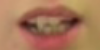

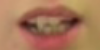

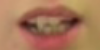

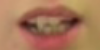

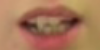

...

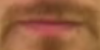

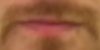

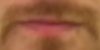

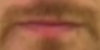

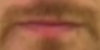

In [ ]:
batch=z[0]["the_input"]
from google.colab.patches import cv2_imshow
print(batch.shape)
for vid in batch:

  for image in vid:
           cv2_imshow(image*255)

In [ ]:
import tensorflow as tf

In [ ]:
def Convolutional3D_block(X,filters,d2kernel,id,padding,convstride=(1,1,1)):

        zero = ZeroPadding3D(padding=padding, name='zero'+id)(X)
        conv = Conv3D(filters, (3, d2kernel, d2kernel), strides=convstride, kernel_initializer='he_normal', name='conv'+id)(zero)
        batc = BatchNormalization(name='batc'+id)(conv)
        actv = Activation('relu', name='actv'+id)(batc)
        
        maxp = MaxPooling3D(pool_size=(1, 2, 2), strides=(1, 2, 2), name='max'+id)(actv)
        drop = SpatialDropout3D(0.5,name='drop'+id)(maxp)

       

        return drop

In [ ]:
def stconvolution(X):
      
      conv3d1=Convolutional3D_block(X,32,5,'1',(1,2,2),convstride=(1,2,2))

      conv3d2=Convolutional3D_block(conv3d1,64,5,'2',(1,2,2),convstride=(1,1,1))
      conv3d3=Convolutional3D_block(conv3d2,96,3,'3',(1,1,1),convstride=(1,1,1))

      return conv3d3

In [ ]:
def Utterance_block(X,dimension,no_clas):
       x = TimeDistributed(Flatten())(X)


  
    
       x = Bidirectional(GRU(dimension, return_sequences=True ,kernel_initializer='Orthogonal', name='gru1'), merge_mode='concat')(x)
       x = Activation('relu')(x)
       x = Bidirectional(GRU(dimension, return_sequences=True ,kernel_initializer='Orthogonal', name='gru2'), merge_mode='concat')(x)
       x = Activation('relu')(x)

       # Output layer
       x = Dense(no_clas, activation="softmax", name="dense2")(x)
       return x
        

In [ ]:
def Lipnet(config):
      input_data = Input(name='the_input', shape=config.input_shape, dtype='float32')
      x=stconvolution(input_data)
      x=Utterance_block(x,config.dimension,config.no_class)  
      
      labels = Input(name='the_labels', shape=[config.seqlen], dtype='float32')       
      input_length = Input(name='input_length', shape=[1], dtype='float32')   
      label_length = Input(name='label_length', shape=[1], dtype='float32') 
      output = CTCLayer(name="ctc")(labels, x,input_length,label_length)
      
      model = Module(inputs=[input_data, labels, input_length, label_length], outputs=output )
    
      return model

In [ ]:
class CTCLayer(Layer):
    def __init__(self, name=None):
        super().__init__(name=name)
        self.loss_fn =F.ctc_batch_cost

    def call(self, y_true, y_pred,input_length,label_length):     
        
        y_pred = y_pred[:, 2:, :]
        loss = self.loss_fn(y_true, y_pred, input_length, label_length)

        return loss

In [ ]:
def Lipnet(config):
    input_data = Input(name='the_input', shape=config.input_shape, dtype='float32')
    labels = Input(name='the_labels', shape=[config.seqlen], dtype='float32')       
    input_length = Input(name='input_length', shape=[1], dtype='int64')   
    label_length = Input(name='label_length', shape=[1], dtype='int64')    
     
   
   
   
    stcnn1_padding = ZeroPadding3D(padding=(1,2,2))(input_data) 
    stcnn1_convolution = Conv3D(16, (3, 5, 5), strides=(1,2,2), kernel_initializer='he_uniform')(stcnn1_padding)
    stcnn1_bn = BatchNormalization()(stcnn1_convolution)
    stcnn1_acti = Activation('relu')(stcnn1_bn)
    stcnn1_dp = SpatialDropout3D(0.2)(stcnn1_acti)
    stcnn1_maxpool = MaxPooling3D(pool_size=(1, 2, 2), strides=(1, 2, 2),name='stcn1')(stcnn1_dp)

    stcnn2_padding = ZeroPadding3D(padding=(1,2,2))(stcnn1_maxpool)
    stcnn2_convolution = Conv3D(32, (3, 5, 5), strides=(1,2,2), kernel_initializer='he_uniform')(stcnn2_padding)
    stcnn2_bn = BatchNormalization()(stcnn2_convolution)
    stcnn2_acti = Activation('relu')(stcnn2_bn)
    stcnn2_dp = SpatialDropout3D(0.2)(stcnn2_acti)
    stcnn2_maxpool = MaxPooling3D(pool_size=(1, 2, 2), strides=(1, 2, 2),name='stcn2')(stcnn2_dp)

    stcnn3_padding = ZeroPadding3D(padding=(1,2,2))(stcnn2_maxpool)
    stcnn3_convolution = Conv3D(64, (3, 3, 3), strides=(1,2,2), kernel_initializer='he_uniform')(stcnn3_padding)
    stcnn3_bn = BatchNormalization()(stcnn3_convolution)
    stcnn3_acti = Activation('relu')(stcnn3_bn)
    stcnn3_dp = SpatialDropout3D(0.2)(stcnn3_acti)
    stcnn3_maxpool = MaxPooling3D(pool_size=(1, 2, 2), strides=(1, 2, 2),name='stcn3')(stcnn3_dp)

    stcnn3_maxpool_flatten = TimeDistributed(Flatten(),name='features')(stcnn3_maxpool)

    gru_1 = GRU(config.dimension, return_sequences=True, name='gru1_a')(stcnn3_maxpool_flatten)
    gru_1b = GRU(config.dimension, return_sequences=True, go_backwards=True, name='gru1_b')(stcnn3_maxpool_flatten)
    gru1_merged = concatenate([gru_1, gru_1b], axis=2,name='gru1')
    gru1_dropped = gru1_merged

    gru_2 = GRU(config.dimension, return_sequences=True, name='gru2_a')(gru1_dropped)
    gru_2b = GRU(config.dimension, return_sequences=True, go_backwards=True, name='gru2_b')(gru1_dropped)
    gru2_merged = concatenate([gru_2, gru_2b], axis=2,name='gru2')
    gru2_dropped = gru2_merged
    #fc linear layer



    y_pred=Dense(config.no_class, activation="softmax", name="dense2")(gru2_dropped)

    loss_out  = CTCLayer(name="ctc")(labels, y_pred,input_length,label_length)

    model = Module(inputs=[input_data, labels, input_length, label_length], outputs=[loss_out])


    return model

In [ ]:
class config:
  def __init__(self,input_shape,outputlen):
    self.no_class=28
    self.input_shape=input_shape
    self.seqlen=outputlen
    self.dimension=64

In [ ]:
configurationlipnet=config((None,50,100,3),(None))

In [ ]:
lip_model=Lipnet(configurationlipnet)

In [ ]:
print(lip_model.summary())

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
the_input (InputLayer)          [(None, None, 50, 10 0                                            
__________________________________________________________________________________________________
zero_padding3d_3 (ZeroPadding3D (None, None, 54, 104 0           the_input[0][0]                  
__________________________________________________________________________________________________
conv3d_3 (Conv3D)               (None, None, 25, 50, 3616        zero_padding3d_3[0][0]           
__________________________________________________________________________________________________
batch_normalization_3 (BatchNor (None, None, 25, 50, 64          conv3d_3[0][0]                   
______________________________________________________________________________________________

In [ ]:
def get_callbacks(save_best=True,monitor='loss')  :
    my_callbacks = [
        tf.keras.callbacks.ModelCheckpoint(filepath='/content/drive/My Drive/lipnet.h5',monitor=monitor,save_best_only=save_best,save_weights_only=True),
        tf.keras.callbacks.ReduceLROnPlateau(monitor="loss",factor=0.2, patience=5, verbose=0, min_delta=0.1, min_lr=0.000001)        
    ]
    return my_callbacks

In [ ]:
traindata=Lipread_Generator(video_path,align_path,batch_size=16,maxsamples=None,shuffle=False)
testdata=Lipread_Generator(testvideo_path,testalign_path,batch_size=16,maxsamples=None,shuffle=False)

In [ ]:
print(len(traindata))
print(len(testdata))


In [ ]:
optimizer =tf.keras.optimizers.Adam(lr=0.0001)
lip_model.compile(loss={'ctc': lambda y_true, y_pred: y_pred},
                        optimizer=optimizer
                        )


In [ ]:
lip_model.fit(traindata,validation_data=testdata,epochs=20,callbacks=get_callbacks(monitor='val_loss'))

Epoch 1/20
1580/1580 [==============================] - 980s 617ms/step - loss: 8.5176 - val_loss: 15.2356
Epoch 2/20
1580/1580 [==============================] - 976s 618ms/step - loss: 8.0804 - val_loss: 14.9063
Epoch 3/20
1580/1580 [==============================] - 970s 614ms/step - loss: 7.9250 - val_loss: 14.6377
Epoch 4/20
1580/1580 [==============================] - 969s 613ms/step - loss: 7.7327 - val_loss: 14.9800
Epoch 5/20
1580/1580 [==============================] - 973s 616ms/step - loss: 7.6526 - val_loss: 14.4873
Epoch 6/20
1580/1580 [==============================] - 969s 613ms/step - loss: 7.5176 - val_loss: 14.9154
Epoch 7/20
1580/1580 [==============================] - 972s 615ms/step - loss: 7.3837 - val_loss: 14.4587
Epoch 8/20
1580/1580 [==============================] - 974s 617ms/step - loss: 7.2709 - val_loss: 14.8020
Epoch 9/20
1580/1580 [==============================] - 975s 617ms/step - loss: 7.2065 - val_loss: 14.4194
Epoch 10/20
1580/1580 [==============

In [ ]:
lip_model.load_weights('/content/drive/My Drive/lipnet.h5')

In [ ]:
lip_model.evaluate(testdata)

288/288 [==============================] - 136s 416ms/step - loss: 14.0361


13.989294052124023

In [ ]:
import string
x=string.ascii_lowercase[:26]
decodestr={}
for i in x:
  decodestr[ord(i)-ord('a')]=i
print(decodestr) 
decodestr[26]=' ' 


{0: 'a', 1: 'b', 2: 'c', 3: 'd', 4: 'e', 5: 'f', 6: 'g', 7: 'h', 8: 'i', 9: 'j', 10: 'k', 11: 'l', 12: 'm', 13: 'n', 14: 'o', 15: 'p', 16: 'q', 17: 'r', 18: 's', 19: 't', 20: 'u', 21: 'v', 22: 'w', 23: 'x', 24: 'y', 25: 'z'}


In [ ]:
prediction_model =Module(
    lip_model.get_layer(name="the_input").input, lip_model.get_layer(name="dense2").output
)
#prediction_model.summary()

def decode_batch_predictions(pred):
    input_len = np.ones(pred.shape[0]) * pred.shape[1]
    results =F.ctc_decode(pred, input_length=input_len, greedy=True)[0][0][
        :, :100
    ]
    output_text = []
    for res in results:
        string=np.array((res))
        resstr =''.join([decodestr[i] for i in string if i>=0])
        output_text.append(resstr)
    return output_text

In [ ]:
def levenshtein(s, t):
  
    rows = len(s)+1
    cols = len(t)+1
    distance = np.zeros((rows,cols),dtype = int)
 
    for i in range(1, rows):
        distance[i][0] = i
    for k in range(1,cols):            
        distance[0][k] = k
   
    for col in range(1, cols):
        for row in range(1, rows):
            if s[row-1] == t[col-1]:
                cost = 0 
            else:
                cost = 2
              
            distance[row][col] = min(distance[row-1][col] + 1,      # Cost of deletions
                                 distance[row][col-1] + 1,          # Cost of insertions
                                 distance[row-1][col-1] + cost)     # Cost of substitutions
    Ratio = ((len(s)+len(t)) - distance[row][col]) / (len(s)+len(t))
    return Ratio

In [ ]:
acc=[]
for i in range(5):
    z=testdata[i]
    batchvideos=z[0]['the_input']
    batchtrans=z[0]['the_labels']
    batchlen=z[0]['label_length']

    for vid,txt,ln in zip(batchvideos,batchtrans,batchlen):
        preds=prediction_model.predict(tf.expand_dims(vid,0))
        src=''.join([decodestr[i] for i in txt if i>=0][:ln])
        pred=decode_batch_predictions(preds)[0]
        print('\ngroundtruth  :',src)
        print('prediction  :',pred)
        print('score :',levenshtein(src,pred))
        #acc.append(levenshtein(src,pred))
        #print(preds)



  

                 


groundtruth  : lay green with q zero soon
prediction  : ldlay green it y zero soon
score : 0.8846153846153846

groundtruth  : place blue at v four again
prediction  : lplace blue in h ter again
score : 0.7692307692307693

groundtruth  : place white with k two now
prediction  : lplace white with h two now
score : 0.9433962264150944

groundtruth  : set red with r eight soon
prediction  : set red with e eigt soon
score : 0.9387755102040817

groundtruth  : bin red at c five now
prediction  : bin red an f five again
score : 0.7727272727272727

groundtruth  : lay green at p three please
prediction  : ldlay green an y fhree please
score : 0.8571428571428571

groundtruth  : bin green in k zero soon
prediction  : bdbia green at k zeoo soon
score : 0.8

groundtruth  : set white with c five again
prediction  : set white with f five again
score : 0.9629629629629629

groundtruth  : set red at e three now
prediction  : set red an a three again
score : 0.782608695652174

groundtruth  : set blue in d

In [ ]:
import string
x=string.ascii_lowercase[:26]
decodestr={}
for i in x:
  decodestr[ord(i)-ord('a')]=i
print(decodestr) 
decodestr['26']=' ' 



{0: 'a', 1: 'b', 2: 'c', 3: 'd', 4: 'e', 5: 'f', 6: 'g', 7: 'h', 8: 'i', 9: 'j', 10: 'k', 11: 'l', 12: 'm', 13: 'n', 14: 'o', 15: 'p', 16: 'q', 17: 'r', 18: 's', 19: 't', 20: 'u', 21: 'v', 22: 'w', 23: 'x', 24: 'y', 25: 'z'}


In [ ]:
loss 18


groundtruth  : lay green with e one please
result  : play redn in o ie please

groundtruth  : lay white at x eight now
result  : play blite it i ine now

groundtruth  : place white with o eight again
result  : place wlite wit a ine again

groundtruth  : set blue in f six again
result  : set blue it m ie again

groundtruth  : set red at a one again
result  : set reen it a ige again

groundtruth  : lay blue by d three again
result  : play blite it x ine again

groundtruth  : bin blue in v nine please
result  : sbin whie it i eiee please

groundtruth  : bin white at r six soon
result  : sbin blute it r ie soon

groundtruth  : set red in a eight please
result  : set gree it s re please

groundtruth  : set red in r seven soon
result  : set green it m oo soon

groundtruth  : bin blue by l zero please
result  : sbin blue by b re please

groundtruth  : bin white in d six soon
result  : sbin wlite at e ix soon

groundtruth  : lay blue by b four now
result  : play blue by b ro now

groundtruth  : place white by o zero now
result  : place whute it o rne now

groundtruth  : set green with b five please
result  : set green with s ie please

groundtruth  : place green at p seven soon
result  : place green it x vo soon



loss 13 :

groundtruth  : lay blue with r two now
result  : play blue it u wo now

groundtruth  : lay red in c five now
result  : play red it x fine now

groundtruth  : set green at a seven please
result  : set green an n even please

groundtruth  : set blue at r two now
result  : set blue it z two now

groundtruth  : set green by a seven again
result  : set green by m even again

groundtruth  : lay green with q six soon
result  : play green in c our soon

groundtruth  : place white at d two now
result  : place white an c two now

groundtruth  : bin white by l six soon
result  : pbin white by y eieho soon

groundtruth  : set white in m nine please
result  : set white ay l ine plnase

groundtruth  : bin green by t one please
result  : pbin gree by q eree please

groundtruth  : place blue in h one soon
result  : plplace blue at i ove soon

groundtruth  : place green by p five please
result  : psplace green by u ove please

groundtruth  : place blue with a six please
result  : place blue it o seix please

groundtruth  : place blue at n two soon
result  : set blue it a wo soon

groundtruth  : set red by a two soon
result  : set red by l hio soon

groundtruth  : lay blue at p four now
result  : play blue it p wur now


loss: 8
groundtruth  : lay white by e three soon
result  : pslay white by b three soon

groundtruth  : place blue in n five please
result  : psplace blue it n five please

groundtruth  : lay red with j nine again
result  : play red with q nine again

groundtruth  : bin green at s eight please
result  : pbin green it n eight please

groundtruth  : bin red in x four now
result  : pbin red in r four now

groundtruth  : lay red with q seven soon
result  : pslay red with o seveo soon

groundtruth  : place green by k eight please
result  : pbplace green by b eight please

groundtruth  : lay red in p one again
result  : play red in x one again

groundtruth  : set green in g five now
result  : set green it s five now

groundtruth  : place blue in a zero now
result  : psplay blue bt i zevn now

groundtruth  : set white in n zero again
result  : pset white an n zero again

groundtruth  : bin white with z one again
result  : pbin white it r one again

groundtruth  : place white in o four again
result  : place white in c four again

groundtruth  : bin red with q nine now
result  : pbin red with r nine now

groundtruth  : lay green by k five now
result  : play green by c five now

groundtruth  : lay blue with v four soon
result  : play blue ith o four soon